In [118]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram, stft

import robomimic.dev.hparam.utils.demo_utils as demo_utils
import robomimic.dev.hparam.utils.pkl_utils as pkl_utils
import robomimic.dev.hparam.utils.stat_utils as stat_utils
import robomimic.dev.hparam.utils.plot_utils as plot_utils

import robomimic.dev.hparam.metrics.metric_fn as Metrics
from robomimic.dev.hparam.eval_suite import DemoEvalSuite
import robomimic.dev.hparam.metrics.smoothness_metrics as SmoothnessMetrics

In [26]:
result_dir  = "/home/wjung85/Repo/projects/FastIL/logs/hparam_debug"
baseline_pkls = pkl_utils.get_result_pkl_files(result_dir, filter="bl")
inpaint_pkls  = pkl_utils.get_result_pkl_files(result_dir, filter="inp")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


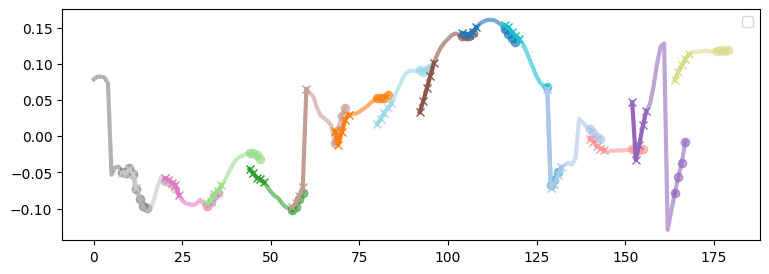

In [176]:
result_dev = pkl_utils.load_result_pkl_file(baseline_pkls[1])
demo_dev = result_dev["rollouts"]["demo_8"]
_ = plot_utils.plot_predictions(demo_dev, action_idx=5)

### Empirical Decision of Window Size and Overlap

1. No big variance of the frequency spectrum along the time axis

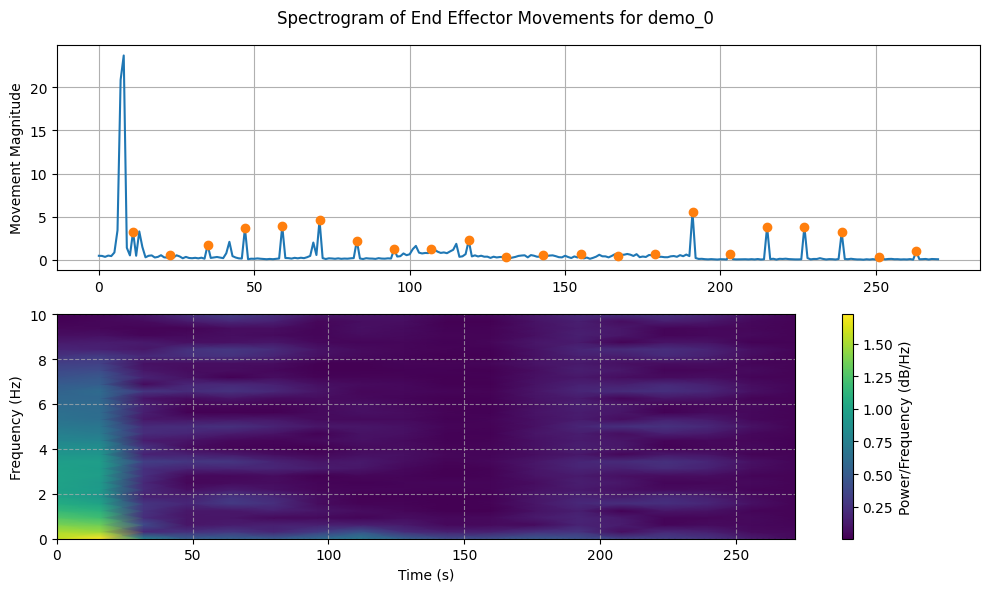

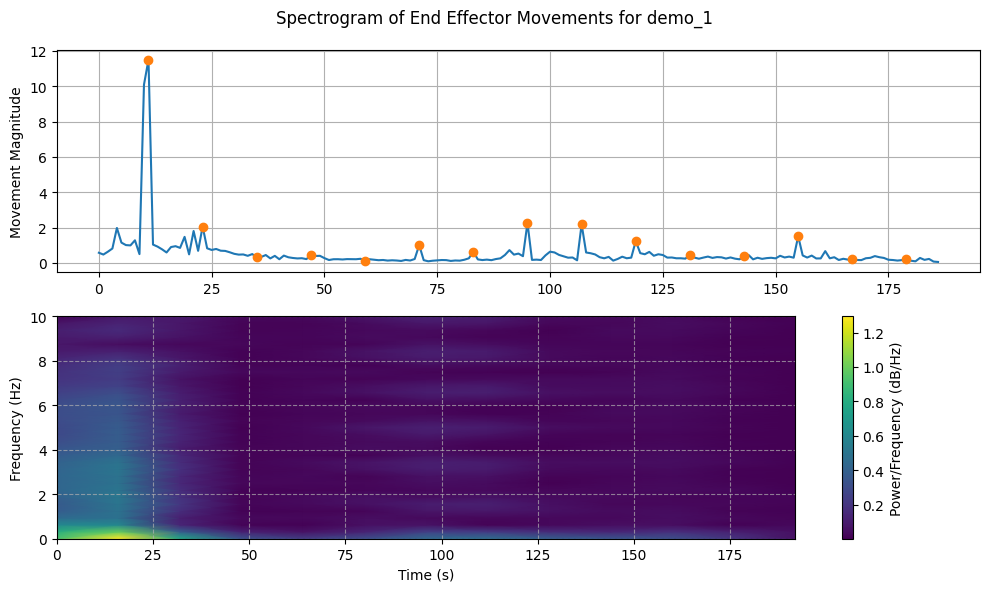

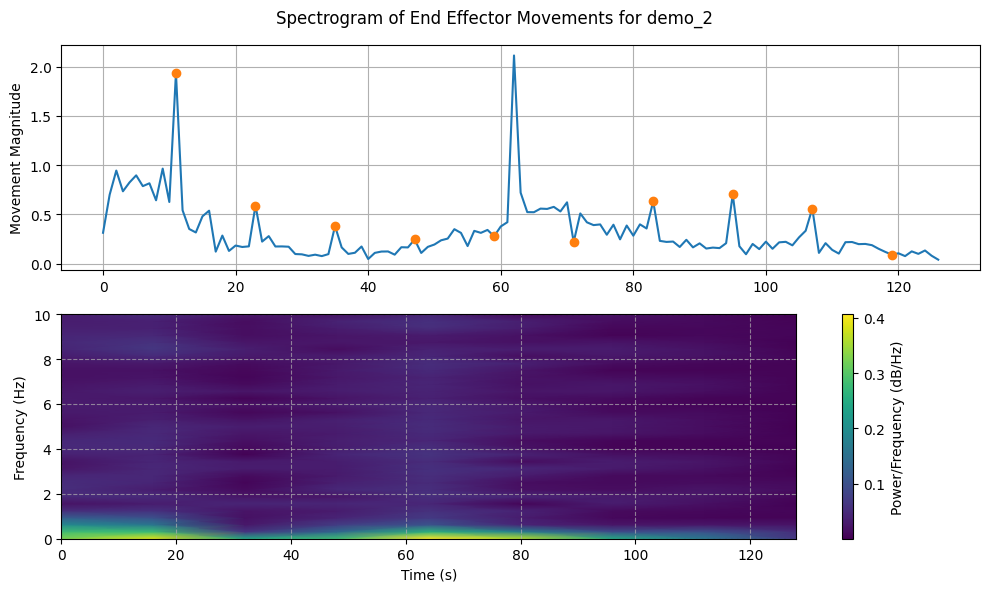

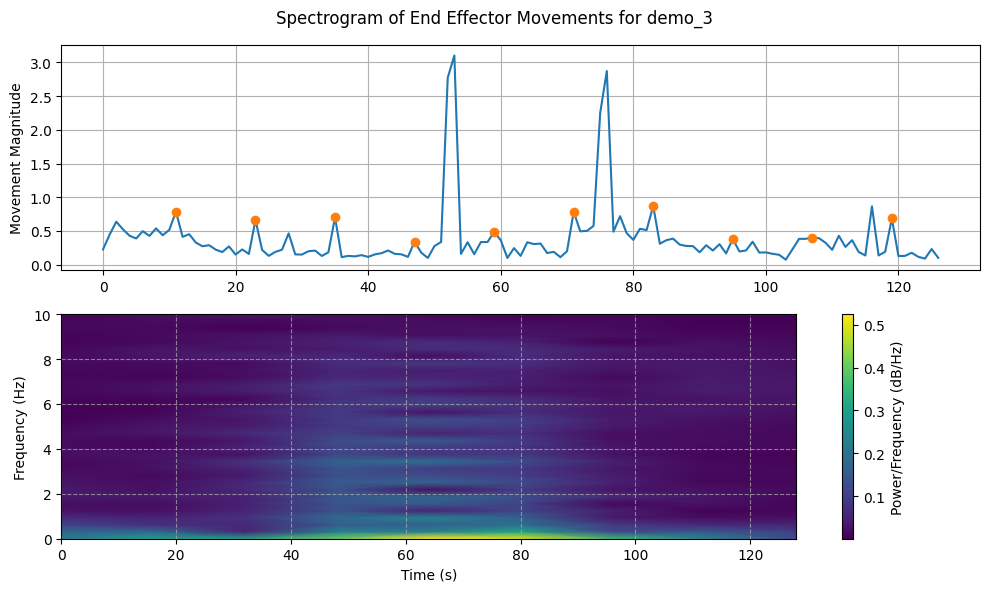

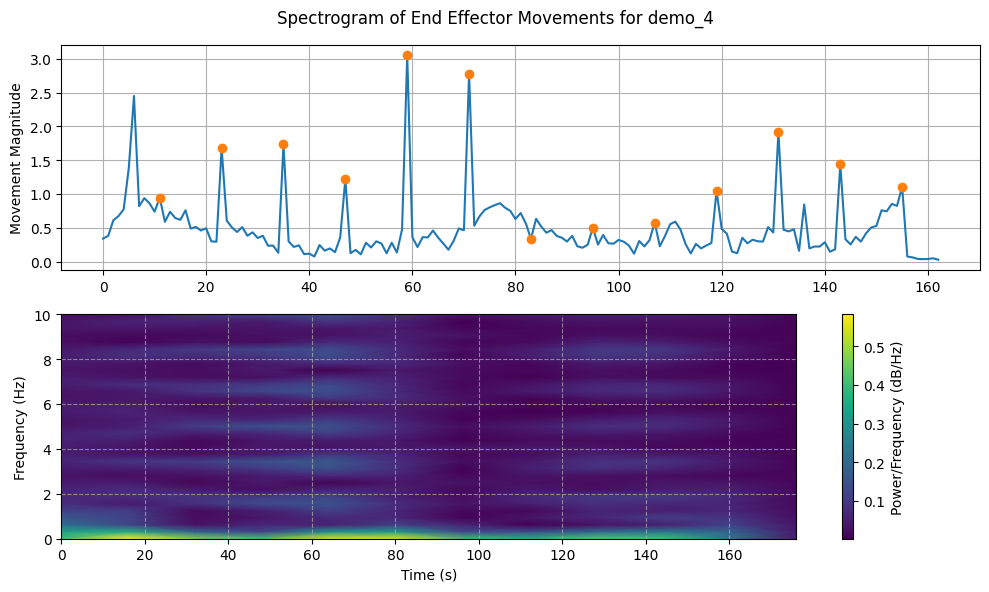

...

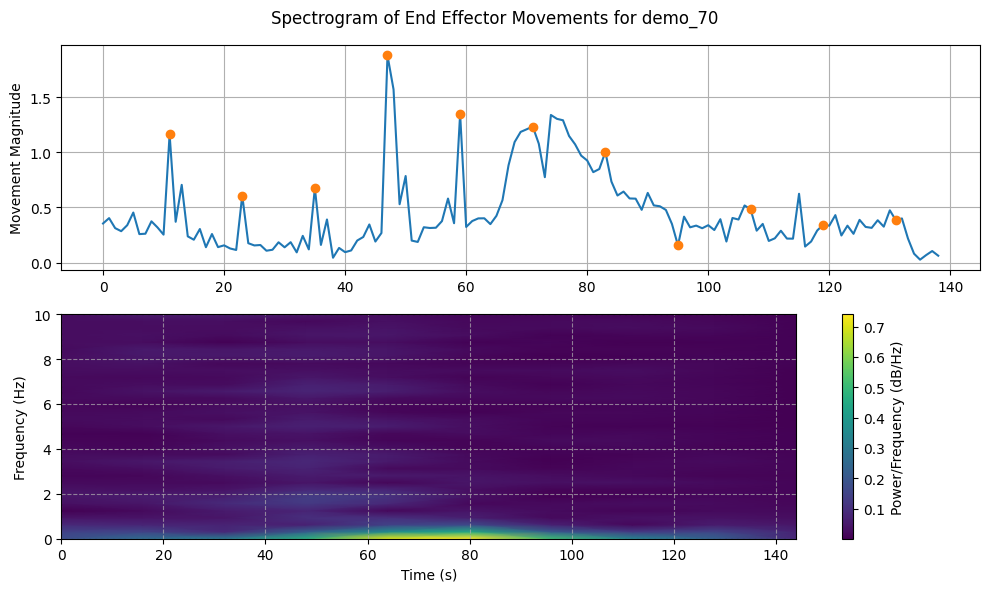

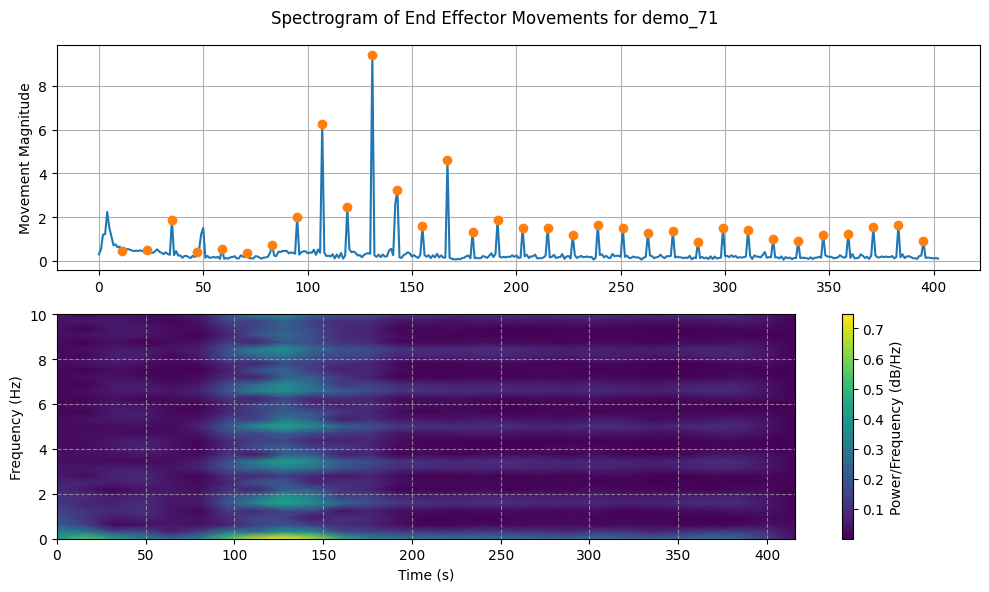

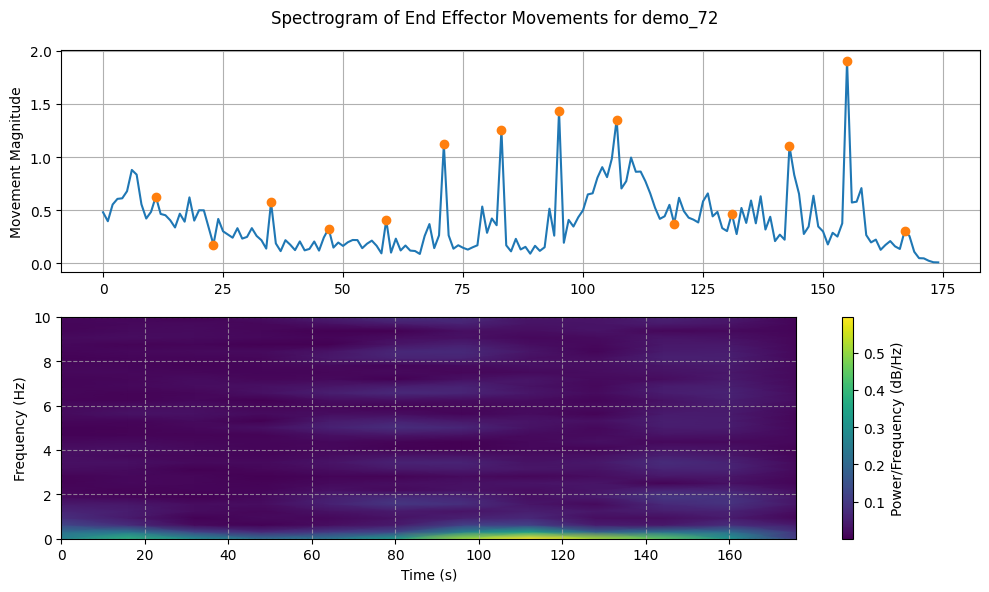

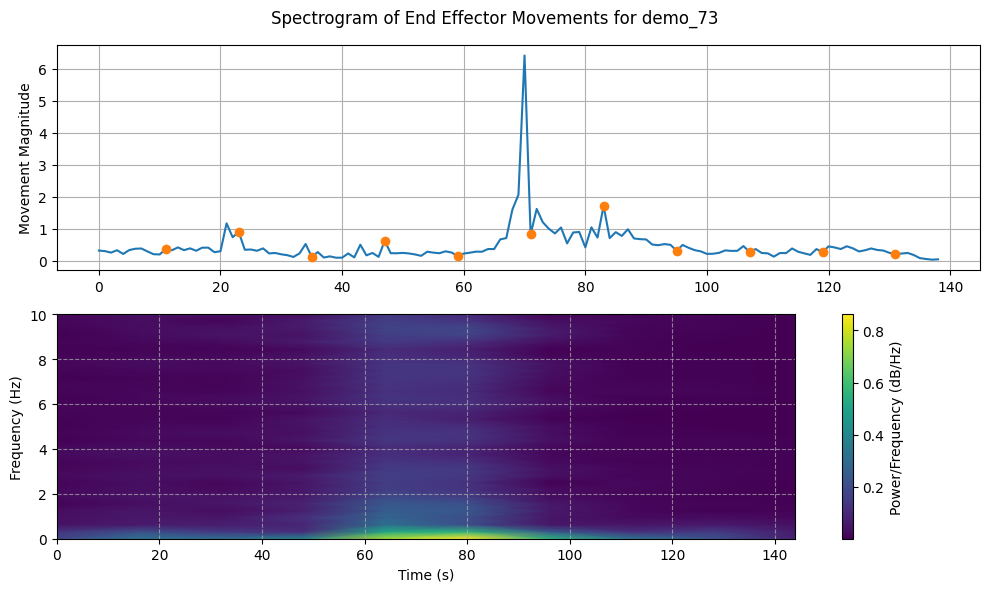

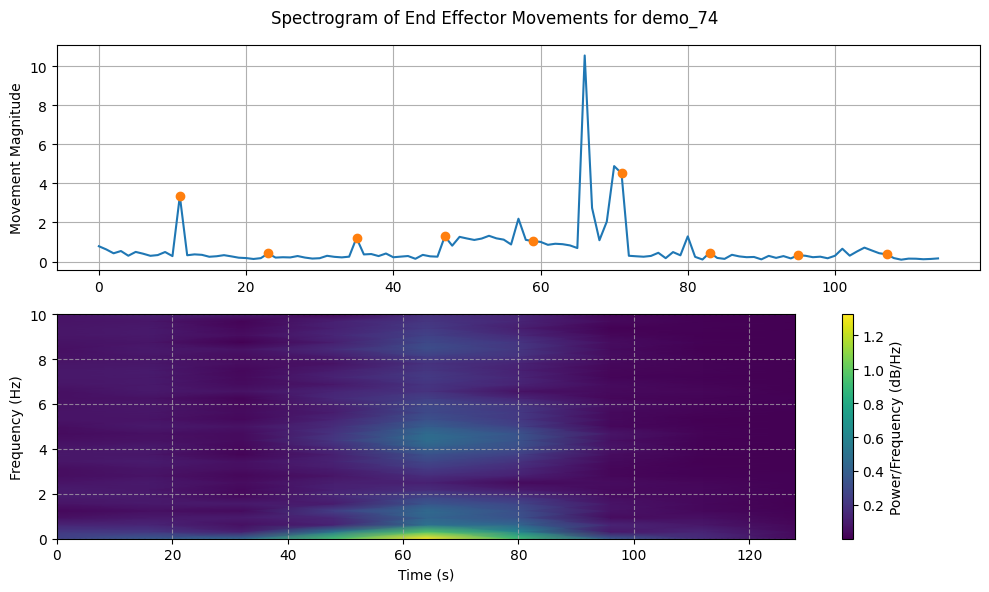

In [168]:
result_idx = 1

result_dev = pkl_utils.load_result_pkl_file(baseline_pkls[result_idx])
# Extract movements
for demo_key, demo in result_dev["rollouts"].items():
    twist = demo_utils.get_end_effector_twist(demo, type="cmd")
    movements = np.linalg.norm(twist, axis=-1)

    # Parameters for spectrogram
    dt = 0.05  # Your sampling interval
    fs = int(1/dt)  # Sampling frequency in Hz
    nperseg = 64   # Length of each segment
    noverlap = 48  # Number of points to overlap between segments

    Ta = demo_utils.get_Ta(demo)

    # Compute spectrogram
    frequencies, times, Sxx = stft(movements,
                                   window = "hamming",
                                   fs=fs,
                                   nperseg=nperseg, 
                                   noverlap=noverlap)
    times = times / dt

    # Create figure and axis objects with shared x axis
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=False)
    
    # Plot time series
    time_points = np.arange(len(movements))
    ax1.plot(time_points, movements)

    t_jump = time_points[Ta-1::Ta]
    ax1.plot(t_jump, movements[t_jump], '-o', linewidth=0)
    ax1.set_ylabel('Movement Magnitude')
    ax1.grid(True)
    
    # Plot spectrogram
    im = ax2.pcolormesh(times, frequencies, np.abs(Sxx),
                        shading='gouraud',
                        cmap='viridis')

    plt.colorbar(im, ax=ax2, label='Power/Frequency (dB/Hz)')
    ax2.set_ylabel('Frequency (Hz)')
    ax2.set_xlabel('Time (s)')
    # ax2.set_ylim(0, 10)
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    plt.suptitle(f'Spectrogram of End Effector Movements for {demo_key}')
    plt.tight_layout()
    plt.show()

In [146]:
import torch
import robomimic.utils.torch_utils as torch_utils

def sparc(actions, dt, padlevel=0, fc=20, amp_th=0.05, return_data = False):
    """
    Compute the increase of SPARC from actions_prev to actions_to_add
    """
    twist = torch_utils.pose_to_twist(actions, dt)
    movements = torch.norm(twist, dim=-1)
    sparc_curr = SmoothnessMetrics.sparc(movements, dt=dt, padlevel=padlevel, fc=fc, amp_th=amp_th, return_data=return_data)

    return sparc_curr

def delta_sparc_demo(demo):
    actions_all = demo["executed_actions"]
    horizon = len(actions_all)
    Ta = demo_utils.get_Ta(demo)

    for 

    
    horizon = len(movements)
    Ta      = demo_utils.get_Ta(demo)

    actions_prev = actions[]
    sparc_i = delta_sparc(actions_prev, actions_to_add)

    movements_prev = movements[(i - sw)*Ta - 1 : i*Ta - 1]
    movements_to_add = 

    


    return delta_sparc

array([  0,  12,  24,  36,  48,  60,  72,  84,  96, 108])

In [149]:
time_points[3::4]

array([  1,   5,   9,  13,  17,  21,  25,  29,  33,  37,  41,  45,  49,
        53,  57,  61,  65,  69,  73,  77,  81,  85,  89,  93,  97, 101,
       105, 109, 113])

array([  0.,  48.,  96., 144.])

In [50]:
result = SmoothnessMetrics.analyze_sparc_progression(demo_dev)
result["success"] = True

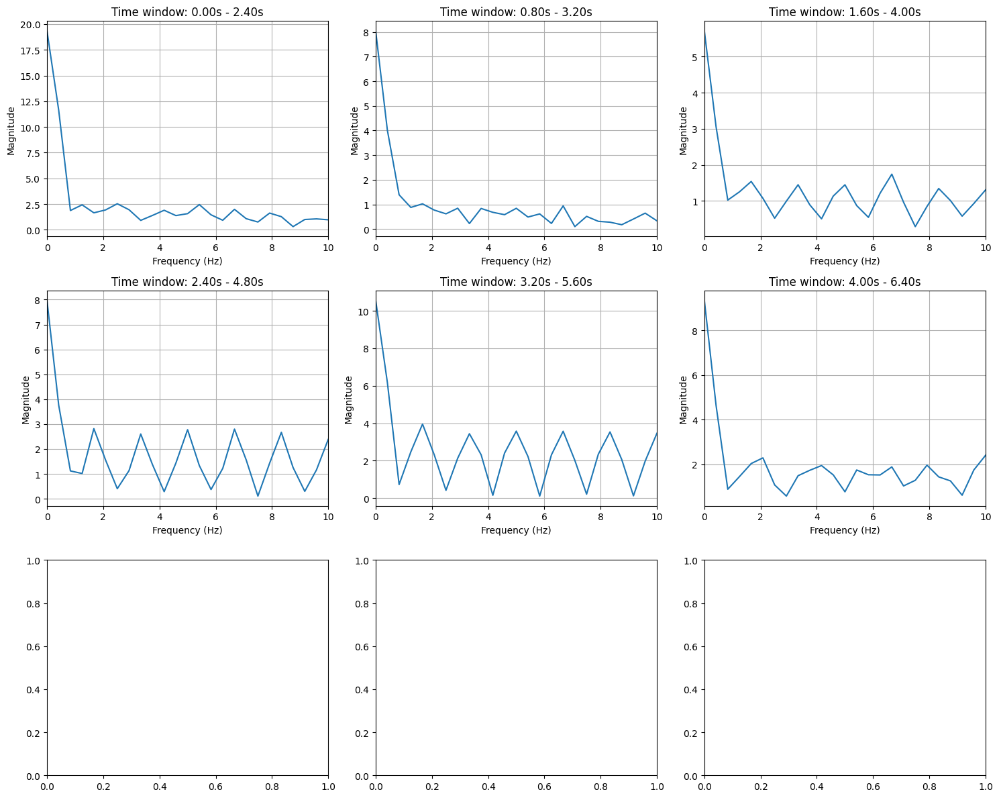

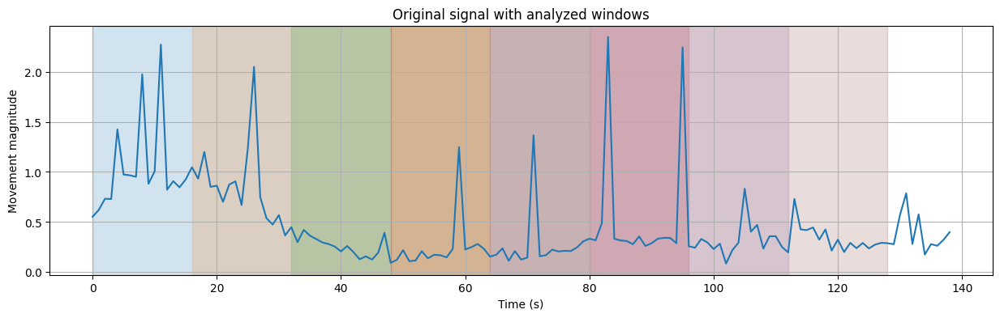

In [56]:
# Extract movements
twist = demo_utils.get_end_effector_twist(demo_dev, type="cmd")
movements = np.linalg.norm(twist, axis=-1)

# Parameters
dt = 0.05  # sampling interval
fs = int(1/dt)  # sampling frequency
window_size = 48  # size of sliding window
hop_length = 16   # number of samples between windows

# Calculate number of windows
n_windows = 1 + (len(movements) - window_size) // hop_length
times = np.arange(n_windows) * hop_length * dt

# Create figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

# Plot FFT for 9 different time windows
for i in range(min(9, n_windows)):
    # Get data for current window
    start_idx = i * hop_length
    window_data = movements[start_idx:start_idx + window_size]
    
    # Apply Hanning window
    window = np.hanning(len(window_data))
    windowed_data = window_data * window
    
    # Compute FFT
    fft_result = np.fft.rfft(windowed_data)
    frequencies = np.fft.rfftfreq(len(window_data), d=dt)
    
    # Plot
    axes[i].plot(frequencies, np.abs(fft_result))
    axes[i].set_title(f'Time window: {times[i]:.2f}s - {times[i] + window_size*dt:.2f}s')
    axes[i].set_xlabel('Frequency (Hz)')
    axes[i].set_ylabel('Magnitude')
    axes[i].grid(True)
    axes[i].set_xlim(0, 10)  # limit to 0-10 Hz for better visualization

plt.tight_layout()
plt.show()

# Also plot the original signal with window positions
plt.figure(figsize=(15, 4))
plt.plot(np.arange(len(movements)), movements)
for i in range(min(9, n_windows)):
    start_idx = i * hop_length
    end_idx = start_idx + window_size
    plt.axvspan(start_idx, end_idx, alpha=0.2, color=f'C{i}')
plt.xlabel('Time (s)')
plt.ylabel('Movement magnitude')
plt.title('Original signal with analyzed windows')
plt.grid(True)
plt.show()

In [30]:
frequencies

array([ 0.        ,  0.41666667,  0.83333333,  1.25      ,  1.66666667,
        2.08333333,  2.5       ,  2.91666667,  3.33333333,  3.75      ,
        4.16666667,  4.58333333,  5.        ,  5.41666667,  5.83333333,
        6.25      ,  6.66666667,  7.08333333,  7.5       ,  7.91666667,
        8.33333333,  8.75      ,  9.16666667,  9.58333333, 10.        ])

In [24]:
movements.shape

(403,)

In [21]:
times

array([6.4])